# **An Explorative Data Analysis on Data Science, AI, and ML Job Salaries in 2025**
#### **By Tawakalt Akolade**


##  **1. Introduction**
With the rising demand for Data Scientists, AI, and ML professionals, salaries in these fields have become a hot topic.This exploratory data analysis (EDA) investigates global salary trends in 2025, focusing on how factors like experience, job title, company size, 
location, and remote work influence pay. The goal is to uncover patterns that reveal where talent is most rewarded and why.

## **2. Objectives**

- To explore salary distribution across AI, ML, and Data Science roles.
- To identify top-paying job titles and experience levels.
- To analyze how company size, job location, and employee residence affect salaries.
- To investigate the impact of remote work (remote ratio) on compensation.
- To compare salary trends across different countries and regions.
- To generate insights useful for job seekers, recruiters, and organizations.


## **3. Dataset Overview**

This dataset provides insights into salaries for Data Science, AI, and Machine Learning roles in 2025. It includes details such as job titles, experience levels, company sizes, locations, and the extent of remote work, offering a broad view of how different factors influence compensation in the tech industry.


### **3.1 Source**

The dataset is publicly available on Kaggle:

🔗 [Salaries for Data Science Jobs – Kaggle](https://www.kaggle.com/datasets)


### **3.2 Columns in the Dataset**
<table>
  <thead>
    <tr>
      <th>Column Name</th>
      <th>Description</th>
    </tr>
  </thead>
  <tbody>
    <tr><td>work_year</td><td>Year the salary was reported (e.g., 2025)</td></tr>
    <tr><td>job_title</td><td>Role of the employee (e.g., Data Scientist, ML Engineer)</td></tr>
    <tr><td>experience_level</td><td>Job seniority: EN (Entry), MI (Mid), SE (Senior), EX (Executive)</td></tr>
    <tr><td>employment_type</td><td>Employment type: FT (Full-time), PT (Part-time), etc.</td></tr>
    <tr><td>salary</td><td>Salary amount in original currency</td></tr>
    <tr><td>salary_currency</td><td>Currency used for the reported salary</td></tr>
    <tr><td>salary_in_usd</td><td>Salary converted to USD for standard comparison</td></tr>
    <tr><td>employee_residence</td><td>Country where the employee resides</td></tr>
    <tr><td>remote_ratio</td><td>Percentage of remote work (0 = onsite, 50 = hybrid, 100 = fully remote)</td></tr>
    <tr><td>company_location</td><td>Country where the company is located</td></tr>
    <tr><td>company_size</td><td>Company size: S (Small), M (Medium), L (Large)</td></tr>
  </tbody>
</table>


## **4. Importing Required Libraries**
This section imports all the essential Python libraries used for data analysis and visualization

In [20]:
# Import pandas for handling dataframes and structured data
import pandas as pd

# Import numpy for numerical operations and array handling
import numpy as np

# Import plotly express and graph_objects for creating interactive visualizations
import plotly.express as px
import plotly.graph_objects as go

# Import seaborn for statistical and attractive visualizations
import seaborn as sns

# Import matplotlib for general plotting and chart customization
import matplotlib.pyplot as plt


## **5. Dataset Initialization**

In [21]:
# Load dataset
df = pd.read_csv(r"C:/Users/HP/Downloads/salaries.csv")

# Display the first few rows
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,EN,FT,Data Quality Analyst,60000,GBP,75949,GB,0,GB,M
1,2025,EN,FT,Data Quality Analyst,48000,GBP,60759,GB,0,GB,M
2,2025,SE,FT,Applied Scientist,266000,USD,266000,US,0,US,M
3,2025,SE,FT,Applied Scientist,204000,USD,204000,US,0,US,M
4,2025,SE,FT,Data Scientist,291000,USD,291000,US,0,US,M


## **6. Data Cleaning and Transformation**

This part involves identifying and handling missing values, removing duplicates, and correcting or transforming column values for clarity and usability.

In [22]:
# Check for missing values
df.isnull().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [23]:
# Inspect data types and structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141566 entries, 0 to 141565
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   work_year           141566 non-null  int64 
 1   experience_level    141566 non-null  object
 2   employment_type     141566 non-null  object
 3   job_title           141566 non-null  object
 4   salary              141566 non-null  int64 
 5   salary_currency     141566 non-null  object
 6   salary_in_usd       141566 non-null  int64 
 7   employee_residence  141566 non-null  object
 8   remote_ratio        141566 non-null  int64 
 9   company_location    141566 non-null  object
 10  company_size        141566 non-null  object
dtypes: int64(4), object(7)
memory usage: 11.9+ MB


### **6.1 Data Filtering**
Filtered the dataset to include only relevant job roles: Data Scientist, AI Engineer, Machine Learning Engineer, and Applied Scientist.

In [24]:
# Define the relevant job roles we want to focus on
target_roles = [
    'Data Scientist',
    'AI Engineer',
    'Machine Learning Engineer',
    'Applied Scientist'
]

# Filter the dataset to include only the selected roles
filtered_df = df[df['job_title'].isin(target_roles)]

# Preview the filtered dataset
filtered_df.head()


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
2,2025,SE,FT,Applied Scientist,266000,USD,266000,US,0,US,M
3,2025,SE,FT,Applied Scientist,204000,USD,204000,US,0,US,M
4,2025,SE,FT,Data Scientist,291000,USD,291000,US,0,US,M
5,2025,SE,FT,Data Scientist,197000,USD,197000,US,0,US,M
6,2025,SE,FT,Data Scientist,349000,USD,349000,US,0,US,M


In [25]:
# Define function to categorize remote work ratio
def remote_category(ratio):
    if ratio == 0:
        return 'On-site'
    elif ratio == 100:
        return 'Fully Remote'
    else:
        return 'Hybrid'

# Apply the function to create a new column
df['remote_category'] = df['remote_ratio'].apply(remote_category)

# Display the updated DataFrame (optional)
filtered_df.head()


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
2,2025,SE,FT,Applied Scientist,266000,USD,266000,US,0,US,M
3,2025,SE,FT,Applied Scientist,204000,USD,204000,US,0,US,M
4,2025,SE,FT,Data Scientist,291000,USD,291000,US,0,US,M
5,2025,SE,FT,Data Scientist,197000,USD,197000,US,0,US,M
6,2025,SE,FT,Data Scientist,349000,USD,349000,US,0,US,M


In [26]:
# Ensure working on a true copy to avoid SettingWithCopyWarning
filtered_df = filtered_df.copy()

def remote_category(ratio):
    if ratio == 0:
        return 'On-site'
    elif ratio == 100:
        return 'Fully Remote'
    else:
        return 'Hybrid'
filtered_df.loc[:, 'remote_category'] = filtered_df['remote_ratio'].apply(remote_category)

print(filtered_df[['remote_ratio', 'remote_category']].head())


   remote_ratio remote_category
2             0         On-site
3             0         On-site
4             0         On-site
5             0         On-site
6             0         On-site


## **7. Descriptive Statistics: Measures of Location & Spread**

This section uses descriptive statistics to explore the dataset. These methods help to explore, summarize, describe, and understand the main features of the data before doing more advanced analysis..

In [27]:
# Basic descriptive statistics for numerical columns
filtered_df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,30522.000000,3.052200e+04,30522.000000,30522.000000
mean,2024.204607,1.798560e+05,171351.732881,22.852369
std,0.740928,3.150057e+05,71409.821304,41.881424
min,2020.000000,1.400000e+04,15281.000000,0.000000
25%,2024.000000,1.228000e+05,122304.250000,0.000000
50%,2024.000000,1.600000e+05,160000.000000,0.000000
75%,2025.000000,2.128000e+05,212800.000000,0.000000
max,2025.000000,3.040000e+07,750000.000000,100.000000


### **7.1 Measures of Central Tendency (Location)**
- Mean: The average value.
  
- Median: The middle value when the data is sorted.

  
- Mode: The most frequently occurring value.

In [28]:
# Measures of central tendency and dispersion for salary

print("Mean Salary:", filtered_df['salary_in_usd'].mean())
print("Median Salary:", filtered_df['salary_in_usd'].median())
print("Mode Salary:", filtered_df['salary_in_usd'].mode()[0])
print("Standard Deviation:", filtered_df['salary_in_usd'].std())
print("Variance:", filtered_df['salary_in_usd'].var())


Mean Salary: 171351.73288120044
Median Salary: 160000.0
Mode Salary: 160000
Standard Deviation: 71409.8213041037
Variance: 5099362578.684021


###  **7.2 Measures of Spread (Dispersion)**

- Standard Deviation: How much the values deviate from the mean.
  
- Variance: The square of the standard deviation.

- Minimum and Maximum: The smallest and largest values in the dataset.


- *ange: The difference between the maximum and minimum.


In [29]:
# Range
salary_range = filtered_df['salary_in_usd'].max() - filtered_df['salary_in_usd'].min()

# IQR
Q1 = filtered_df['salary_in_usd'].quantile(0.25)
Q3 = filtered_df['salary_in_usd'].quantile(0.75)
iqr = Q3 - Q1

# Standard Deviation
std_dev = filtered_df['salary_in_usd'].std()

# Variance
variance = filtered_df['salary_in_usd'].var()

# Display results
print(f"Range: ${salary_range:,.2f}")
print(f"IQR (Interquartile Range): ${iqr:,.2f}")
print(f"Standard Deviation: ${std_dev:,.2f}")
print(f"Variance: ${variance:,.2f}")


Range: $734,719.00
IQR (Interquartile Range): $90,495.75
Standard Deviation: $71,409.82
Variance: $5,099,362,578.68


## **9. Salary Distributions (USD) in 2025 Across Tech Jobs**

This chart provides a general overview of salary distributions across various tech job roles in 2025. It helps illustrate the overall spread and central tendencies of compensation within the tech industry.


In [30]:
import pandas as pd
import plotly.express as px

# Step 1: If not already done, make a safe copy of the filtered dataset
filtered_df = filtered_df.copy()

# Step 2: Create bins for salary ranges
bins = [0, 100_000, 200_000, 300_000, 400_000, 500_000, 600_000]
labels = ['0–100K', '100–200K', '200–300K', '300–400K', '400–500K', '500–600K']

# Step 3: Apply binning to salary column
filtered_df['salary_range'] = pd.cut(filtered_df['salary_in_usd'], bins=bins, labels=labels)

# Step 4: Count number of roles in each salary range
salary_counts = filtered_df['salary_range'].value_counts().sort_index().reset_index()
salary_counts.columns = ['salary_range', 'count']

# Step 5: Create bar plot using Plotly
fig = px.bar(
    salary_counts,
    x='salary_range',
    y='count',
    labels={'salary_range': 'Salary Range (USD)', 'count': 'Number of Roles'},
    title="Salaries Distribution (USD) in 2025 Across Tech Jobs<br><sup>Majority of roles fall in the 100K–200K salary range; salaries above 400K are rare.</sup>",
    template="plotly_white",
)

# Step 6: Improve layout
fig.update_layout(
    title_font_size=20,
    title_x=0.5,
    xaxis_title="Salary Range (USD)",
    yaxis_title="Number of Roles",
    showlegend=False
)

# Step 7: Show the plot
fig.show()

### **Key Observations**

- Most salaries fall between **100K–200K USD**, showing this is the dominant pay range in tech.
  
- **0–100K USD** is the next most common, reflecting entry-level or lower-paying roles.
  
- Salaries above **300K USD are rare**, especially those in the 400K+ range.

- The distribution is **right-skewed**, meaning fewer people earn very high salaries.

- Useful for **job seekers** and **employers** to understand market expectations.


## **10. Salary Distribution by Job Titles (2025)**
This box plot compares salary distributions across four tech roles in 2025.


In [31]:
import pandas as pd
import plotly.express as px

filtered_df = filtered_df[filtered_df['job_title'].isin([
    'Machine Learning Engineer',
    'AI Engineer',
    'Data Scientist',
    'Applied Scientist'
])]

# Step 2: Plot box plot with Plotly
fig_role = px.box(
    filtered_df, 
    x='job_title', 
    y='salary_in_usd',
    title='Salary Distribution by Job Titles (2025) <br><sup>ML Engineers earn the highest with wider salary spread</sup>',
    labels={
        'job_title': 'Job Titles',
        'salary_in_usd': 'Salary (USD)'
    },
    color='job_title'
)

# Step 3: Improve layout
fig_role.update_layout(
    xaxis_title="Job Titles",
    yaxis_title="Salary (USD)",
    legend_title="Job Titles",
    font=dict(size=14),
    title_x=0.5
)

# Step 4: Show the plot
fig_role.show()


### **Key Observations**

- Machine Learning Engineers have the highest median salary (around \$300K) and the widest range, showing both high variability and top-end opportunities.

- Applied Scientists and AI Engineers earn similar median salaries (about \$200K), though AI Engineers show more outliers, indicating occasional very high salaries.

- Data Scientists earn a bit less on average, and their salaries vary widely because they are employed in many different types of industries, each with its own pay scale.

**In summary,** the type of role strongly affects salary. Machine Learning Engineers generally earn the most and show greater variation in pay, highlighting the diversity of opportunities in that field.


## **11. Correlation Between Salary and Remote Ratio**
his matrix compares the relationship between remote work ratio and salary for tech jobs in 2025.

In [32]:
# Keep only numerical columns
numerical_df = filtered_df.select_dtypes(include=['float64', 'int64'])

# Optional: drop 'work_year' and 'salary' if already replaced with 'salary_in_usd'
numerical_df = numerical_df.drop(columns=['work_year', 'salary'], errors='ignore')

# Check correlation matrix
correlation_matrix = numerical_df.corr(numeric_only=True)
correlation_matrix


,salary_in_usd,remote_ratio
salary_in_usd,1.000000,-0.049953
remote_ratio,-0.049953,1.000000


In [33]:
import plotly.express as px
import pandas as pd

# Drop unnecessary columns
corr_df = filtered_df.drop(columns=['work_year', 'salary'], errors='ignore')

# Compute correlation matrix
correlation_matrix = corr_df.corr(numeric_only=True)

# Convert to long-form DataFrame for Plotly
corr_long = correlation_matrix.reset_index().melt(id_vars='index')
corr_long.columns = ['Variable 1', 'Variable 2', 'Correlation']

# Create interactive heatmap
fig = px.imshow(
    correlation_matrix,
    text_auto=".2f",
    color_continuous_scale='RdBu_r',
    title="Correlation Between Salary and Remote Ratio",
)

# Customize layout and subtitle
fig.update_layout(
    title={
        'text': "Correlation Between Salary and Remote Ratio<br><sup>Remote work shows a weak negative correlation (−0.05) with salary, suggesting minimal impact.</sup>",
        'x': 0.5,
        'xanchor': 'center'
    },
    width=800,
    height=500
)

fig.show()

### **Key Observations**

- **Salary** has a perfect correlation with itself (**1.0**).
- **Remote ratio** shows a **weak negative correlation (−0.05)** with salary.
  
This suggests that **fully remote roles might offer slightly lower pay**, but the relationship is **minimal** and likely **not significant**.

### **Salary Distribution by Experience Level**

This visualization shows how salaries vary across different experience levels in tech roles in 2025. 

In [34]:
import plotly.express as px

# Map abbreviations to full labels
experience_map = {
    'EN': 'Entry-level',
    'MI': 'Mid-level',
    'SE': 'Senior-level',
    'EX': 'Executive-level'
}
filtered_df['Experience_Full'] = filtered_df['experience_level'].map(experience_map)

# Interactive violin plot
fig = px.violin(
    filtered_df,
    x='Experience_Full',           # Use the full label for x-axis
    y='salary_in_usd',             # Replace with your actual salary column
    color='Experience_Full',       # Match with the x-axis
    box=True,                      # Show mini boxplot
    points='all',                  # Show all points
    hover_data=filtered_df.columns,  # Use filtered_df for hover data
    title="Salary Distribution by Experience Level"
)

# Customize layout
fig.update_layout(
    title={
        'text': "Salary Distribution by Experience Level<br><sup>Senior roles earn more, but Executive pay varies widely</sup>",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Experience Level",
    yaxis_title="Salary (USD)",
    template="plotly_white"
)

fig.show()


### **Key Observations**

This violin plot shows salary distributions across different experience tiers: Entry (EN), Mid (MI), Senior (SE), and Executive (EX). 
 
Senior-level roles command the highest average salaries, followed by Mid-level and Entry-level positions. Executive roles show high variance, suggesting a wider spread of pay.

The plot helps visualize how career progression impacts compensation and can guide expectations for professionals aiming to level up in their careers.

Overall, this visualization highlights how career progression influences compensation while underscoring variability within high-level roles.


### **12. Remote Work Trends by Job Title (2025)**

This chart compares how each job title is distributed across **On-site**, **Remote**, and **Hybrid** work categories.


In [35]:
import plotly.express as px
import pandas as pd

# Copy the original filtered dataframe
df_copy = filtered_df.copy()

# Group by job title and remote category, then count
remote_count = (
    df_copy.groupby(['job_title', 'remote_category'])
    .size()
    .reset_index(name='count')
)

# Calculate percentage share per job title
total_per_title = remote_count.groupby('job_title')['count'].transform('sum')
remote_count['percentage'] = (remote_count['count'] / total_per_title) * 100

# Create label for display
remote_count['label'] = remote_count['remote_category'] + ' (' + remote_count['percentage'].round(1).astype(str) + '%)'

# Focus on top 10 most common job titles
top_jobs = df_copy['job_title'].value_counts().head(10).index.tolist()
filtered_remote_count = remote_count[remote_count['job_title'].isin(top_jobs)]

# Ensure job_title order based on count for consistent sorting
filtered_remote_count['job_title'] = pd.Categorical(
    filtered_remote_count['job_title'],
    categories=top_jobs,
    ordered=True
)

# Create the figure with updated colors and centered concise title/subtitle
fig = px.bar(
    filtered_remote_count,
    x='percentage',
    y='job_title',
    color='remote_category',
    orientation='h',
    text='label',
    title='<b>Remote Work Distribution by Job Title (2025)</b><br><sup>On-site work leads most roles; Data Scientists work remotely the most.</sup>',
    color_discrete_map={
        'Remote': '#00BFC4',
        'Hybrid': '#F8766D',
        'On-site': '#7CAE00'
    },
    category_orders={'job_title': top_jobs}
)

fig.update_layout(
    barmode='stack',
    xaxis_title='Percentage (%)',
    yaxis_title='Job Title',
    legend_title='Remote Category',
    template='plotly_white',
    bargap=0.05,
    title_x=0.5,          # Center the title and subtitle
    title_font=dict(size=20)
)

fig.update_traces(textposition='inside')

fig.show()


### **Key Observations**

- Data Scientists have the **highest remote work ratio** → **23.8%**.

- Applied Scientists have the **lowest remote ratio** → **19.1%**, with **80.9%** working on-site.

- Most roles are still majorly on-site, especially **Machine Learning Engineers** and **AI Engineers**.
  
- Hybrid roles are rare across all job titles.


###  **13. Average Salary by Job Title and Remote Work Type**

This chart compares the average salary (in USD) across different remote work types — Remote, Hybrid, and On-site — for each job role. It helps us understand which jobs benefit most (or least) from remote flexibility in terms of pay.

In [36]:
import pandas as pd
import plotly.express as px

# Make a copy so original filtered_df stays untouched
df_copy = filtered_df.copy()

# If 'remote_ratio' is missing in df_copy, add it from original df using aligned index
if 'remote_ratio' not in df_copy.columns:
    df_copy = df_copy.assign(remote_ratio=df.loc[df_copy.index, 'remote_ratio'])

# Map remote_ratio to readable categories without altering filtered_df
remote_map = {0: 'On-site', 50: 'Hybrid', 100: 'Remote'}
df_copy['Remote Category'] = df_copy['remote_ratio'].map(remote_map)

# Group by job title and remote category, then calculate average salary
salary_by_remote = (
    df_copy.groupby(['job_title', 'Remote Category'])['salary_in_usd']
    .mean()
    .reset_index()
)

# Create the grouped bar chart
fig = px.bar(
    salary_by_remote,
    x='job_title',
    y='salary_in_usd',
    color='Remote Category',
    barmode='group',
    title='Average Salary by Job Title and Remote Work Type',
    labels={'salary_in_usd': 'Average Salary (USD)', 'job_title': 'Job Title'},
    text=salary_by_remote['salary_in_usd'].apply(lambda x: f"${x/1000:.0f}k"),  # $ sign + 'k'
    color_discrete_sequence=px.colors.qualitative.Set1
)

fig.update_traces(
    textposition='auto',
    textfont_size=12
)

fig.update_layout(
    xaxis_tickangle=-45,
    uniformtext_minsize=8,
    uniformtext_mode='hide',
    legend_title_text='Remote Work Type',
    margin=dict(t=100, b=80),
    height=600,
    title={
        'text': 'Average Salary by Job Title and Remote Work Type<br><sup>Hybrid roles offer the lowest pay across all tech jobs; on-site roles remain the top earners.</sup>',
        'x': 0.5,
        'xanchor': 'center'
    }
)

fig.show()


### **Key Takeaways**

- On-site roles consistently offer the **highest salaries** across all job titles.
 
- Hybrid roles have the **lowest average salaries**, far behind both on-site and remote options.
  
- **Remote roles** provide competitive pay, especially for:
  
  - Machine Learning Engineers: $194k (Remote)
    
  - Applied Scientists: $165k (Remote)
    
- Machine Learning Engineers (On-site) earn the **highest salary overall**: $200k.
  
- Applied Scientists (Hybrid) have the **lowest pay**: $36k — indicating hybrid may be undervalued for this role.


## **14. Average Salary Distribution Across Regions and Job Roles**

This heatmap explores how average salaries vary across different tech job roles in various global regions, highlighting patterns influenced by geography and job function.

In [37]:
import pandas as pd
import plotly.express as px

# region mapping
region_map = {
    # North America
    'US': 'North America', 'CA': 'North America', 'MX': 'North America', 'PR': 'North America',

    # South America
    'AR': 'South America', 'BR': 'South America', 'CL': 'South America', 'CO': 'South America', 'EC': 'South America',

    # Europe
    'GB': 'Europe', 'DE': 'Europe', 'FR': 'Europe', 'IT': 'Europe', 'ES': 'Europe',
    'NL': 'Europe', 'PL': 'Europe', 'IE': 'Europe', 'SE': 'Europe', 'FI': 'Europe',
    'AT': 'Europe', 'BE': 'Europe', 'BG': 'Europe', 'CZ': 'Europe', 'EE': 'Europe',
    'GR': 'Europe', 'HU': 'Europe', 'LT': 'Europe', 'LU': 'Europe', 'LV': 'Europe',
    'NO': 'Europe', 'PT': 'Europe', 'RO': 'Europe', 'SI': 'Europe', 'SK': 'Europe',
    'UA': 'Europe', 'AD': 'Europe', 'CH': 'Europe', 'HR': 'Europe',

    # Asia
    'IN': 'Asia', 'SG': 'Asia', 'TR': 'Asia', 'KR': 'Asia', 'JP': 'Asia',
    'TW': 'Asia', 'PH': 'Asia', 'VN': 'Asia', 'TH': 'Asia', 'ID': 'Asia',
    'MY': 'Asia', 'HK': 'Asia', 'AM': 'Asia', 'IR': 'Asia',

    # Middle East
    'AE': 'Middle East', 'OM': 'Middle East', 'QA': 'Middle East', 'IL': 'Middle East',

    # Africa
    'NG': 'Africa', 'KE': 'Africa', 'ZA': 'Africa', 'DZ': 'Africa', 'EG': 'Africa',
}

# Create a copy of your filtered dataframe
df_copy = filtered_df.copy()

# Map employee_residence to regions
df_copy['Region'] = df_copy['employee_residence'].map(region_map)

# Drop rows where region couldn't be mapped
df_copy = df_copy.dropna(subset=['Region'])

# Group by region and job title to calculate average salary
avg_salary = (
    df_copy.groupby(['Region', 'job_title'])['salary_in_usd']
    .mean()
    .reset_index()
    .rename(columns={'job_title': 'Job Title', 'salary_in_usd': 'Average Salary'})
)

# Round salaries for better readability
avg_salary['Average Salary'] = avg_salary['Average Salary'].round()

# Create heatmap
fig = px.density_heatmap(
    avg_salary,
    x='Job Title',
    y='Region',
    z='Average Salary',
    color_continuous_scale='Viridis',
    text_auto=True,
    title='Average Salary Distribution Across Regions and Job Roles'
)

fig.update_layout(
    title={
        'text': 'Average Salary Distribution Across Regions and Job Roles<br><sup>Machine Learning and AI roles attract top pay in North America and Africa, while other regions show uneven compensation patterns.</sup>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Job Title',
    yaxis_title='Region',
    coloraxis_colorbar_title='Avg Salary (USD)',
    height=650
)

fig.show()


### **Key Observation from the Heatmap**

- North America consistently shows the **highest salary levels**, especially for **Executive** and **Senior** roles in tech.
  
- Mid-Level roles generally have **moderate salaries**, with noticeable increases in **Europe** and **Oceania** compared to **Asia** or **Africa**.
  
- Entry-Level positions across all regions maintain relatively **lower salaries**, with **Africa** and **Asia** being on the lowest end.
  
- Executive positions in **North America** and **Europe** display **distinctly higher compensation** than other regions.

- Africa** and Asia show **limited variation** in salaries across experience levels, suggesting possible **growth ceiling or compressed pay structure**.


**Overall:**  
The heatmap reveals that **North America and Europe dominate high-paying roles**, while **Africa and Asia trail**, especially at senior levels—highlighting global pay disparities in tech.


## **15. Salary Distribution by Company Size**

This section explores how individual salaries vary across different company sizes (Small, Medium, and Large) to understand how company size may influence salary patterns.


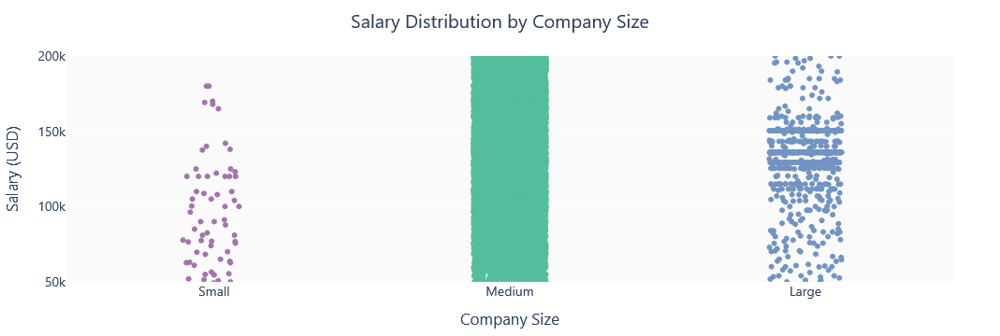

In [38]:
import plotly.express as px

# Create a copy to preserve your original DataFrame
df = filtered_df.copy()

# Map short codes to full names
size_mapping = {
    'S': 'Small',
    'M': 'Medium',
    'L': 'Large'
}
df['Company Size'] = df['company_size'].map(size_mapping)

# Define the correct order
category_order = ['Small', 'Medium', 'Large']

# Create the strip plot
fig = px.strip(
    df,
    x='Company Size',
    y='salary_in_usd',
    color='Company Size',
    category_orders={"Company Size": category_order},
    title="Salary Distribution by Company Size",
    hover_data=['job_title', 'experience_level'],
    color_discrete_sequence=px.colors.qualitative.Bold
)

# Customize appearance
fig.update_traces(
    jitter=0.5,
    opacity=0.7,
    marker=dict(size=6)
)
fig.update_layout(
    title_x=0.5,
    yaxis_title='Salary (USD)',
    xaxis_title='Company Size',
    font=dict(family="Segoe UI", size=14),
    plot_bgcolor='rgba(250, 250, 250, 1)',
    paper_bgcolor='rgba(255, 255, 255, 1)',
    margin=dict(l=50, r=50, t=60, b=50),
    showlegend=False,
    yaxis=dict(range=[50000, 200000])
)

# Show the figure
fig.show()


### **Key Observations**

- **Small Companies:**  
  Salaries vary widely, from low amounts up to \$200k. This wide spread suggests inconsistent pay—possibly due to varying job roles or flexible compensation policies in smaller organizations.

- **Medium Companies:**  
  Most salaries are tightly clustered around \$100k. This suggests a standardized salary structure, likely reflecting similar roles or levels of seniority.

- **Large Companies:**  
  While many salaries are centered around  100k (like in medium firms), there’s also a wider spread reaching 200k. This indicates greater diversity in roles and pay, possibly due to large firms having more departments and job levels.

To sum up, the chart shows that **company size affects salary distribution**:  
- Smaller companies may offer less predictable pay.  
- Medium companies tend to be more consistent.  
- Larger companie provide a broader range of salaries, reflecting diverse roles and more flexible compensation.


# **16. Final Conclusion**

This analysis provides a comprehensive overview of salary trends in the tech industry, revealing how compensation is influenced by multiple factors including job role, experience level, work arrangement, company size, and geographic region.

- **Role Matters**: Machine Learning Engineers consistently earn the highest salaries across all dimensions—work setting, region, and experience level. Roles like Data Scientist, Applied Scientist and AI Engineer also earn competitively but show more variability.

- **Experience Level Drives Pay**: As expected, Senior and Executive positions earn more, but Executive salaries vary significantly across regions—suggesting less standardization at the top.

- **Regional Disparities Are Clear**: North America and Europe dominate in terms of high compensation, while Asia and Africa lag behind, particularly in senior roles. These regional trends point to global pay inequality in the tech workforce.

- **Company Size Affects Salary Spread**: 
  - **Small companies** show inconsistent pay levels.
  - **Medium companies** offer more standardized compensation.
  - **Large companies** present both consistency and a wider range of high-paying opportunities.
    

- **Remote vs On-Site**: On-site roles tend to offer the highest salaries, while hybrid roles have the lowest averages—especially for certain job titles. Remote roles are still competitive but vary by function.

- **Salary Distribution Trends**: The distribution is right-skewed, with most salaries falling between \$100k–\$200k. High-paying roles above \$300k are rare, underscoring the exclusivity of top compensation in tech.


In summary, tech salaries depend on a mix of factors. Knowing how these factors interact can help professionals make informed career decisions.